# Lab 3

This week we look at a new dataset below.

In [ ]:
!curl https://storage.googleapis.com/aiolympiadmy/ioai-2025-tsp/lab3.zip -o lab3.zip

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 50.7M  100 50.7M    0     0  59.4M      0 --:--:-- --:--:-- --:--:-- 59.3M


In [ ]:
!unzip -q lab3.zip

The above commands should create a `train/` folder and `test/` folder in this directory. Each folder contains `images/` and `labels/` subdirectories respectively.

In this dataset, each image is associated with a text file. In the text file, each row represents a single bounding box around a person in the image. Each bounding box is represented by 5 numbers: x_center, y_center, width, height, objectness. Objectness is always 1. All other dimensions are represented as fractions of image dimensions. e.g. x_center's actual pixel location needs to be multiplied by the width of the image.

If you still recall the network you worked with in Lab 2:
```python
class FCN(nn.Module):
    def __init__(self, backbone, head):
        super().__init__()
        self.backbone = backbone
        self.head = head

    def forward(self, x):
        x = self.backbone(x)
        x = self.head(x)
        return x

backbone = ...
head = ...
model = FCN(backbone, head)
```

Here's an idea. Given that the backbone defined above will output a spatial feature map, we can iterate over each cell location in the spatial feature map, and predict if there is an object to detect in that cell (objectness). Notice that this is very similar to FCN segmentation where we were practically doing pixel-wise classification. However, we take this a bit further. If objectness in each cell is high enough, we predict an object within a bounding box as specified by our neural network.

## Another new network

Create a new class that is almost the exact same as `FCN` above, but specify the `head` to be a `nn.Conv2d` layer with kernel size 1. This layer should output 5 channels, corresponding to the 5 numbers in each row of our labels. This network will be architecturally simpler than the FCN of Lab 2!

_1 pt granted upon completion of network definition_

In [ ]:
# Your work here
import torch
from torch import nn
from torchvision.models import resnet34, ResNet34_Weights
class FCN(nn.Module):
    def __init__(self, backbone, head):
        super().__init__()
        self.backbone = backbone
        self.head = head

    def forward(self, x):
        x = self.backbone(x)
        x = self.head(x)
        return x

resnet = resnet34(weights=ResNet34_Weights.DEFAULT)
backbone = nn.Sequential(*list(resnet.children())[:-2])
head = nn.Sequential(nn.Conv2d(512, 5, kernel_size=1))
model = FCN(backbone, head)



Downloading: "https://download.pytorch.org/models/resnet34-b627a593.pth" to /root/.cache/torch/hub/checkpoints/resnet34-b627a593.pth
100%|██████████| 83.3M/83.3M [00:00<00:00, 193MB/s]


## Dataset and dataloaders

Now go ahead and build your Dataset and Dataloaders in Pytorch.

Note that the dataset should calculate and return x_offset and y_offset instead of x_center and y_center. If you leave x_center and y_center as is, you will force your network to also learn how to predict larger values of x_center and y_center with increasing values of x and y on the spatial feature map output by the backbone! You can resolve this by storing the offset between the bounding box center and the center of the cell of the spatial feature map your bounding box is in. I'll help you a little by providing an example:

```python
ipdb>  grid_size
8

ipdb>  grid_y
4

ipdb>  grid_y_min
0.5

ipdb>  y_center
0.5132275132275133

ipdb>  y_offset
0.013227513227513255
```

_1 pt granted upon successfully running the code below_,

```python
train_dataset = ...
test_dataset = ...
train_dataloader = DataLoader(train_dataset, ...)
test_dataloader = DataLoader(test_dataset, ...)
one_X, one_y = next(iter(test_dataset))
batch_X, batch_y = next(iter(test_dataloader))
```

_and demonstrating the following results_:
- `one_X.shape` = (3, im_h, im_w) where im_h and im_w are height and width of the image
- `one_y.shape` = (5, gy, gx) where gy and gx are height and width of the spatial feature map
- `batch_X.shape` = (B, 3, im_h, im_w) where B is batch size
- `batch_y.shape` = (B, 5, gy, gx)

Unless you've went out of your way to resize your images to a shape other than a square, `im_h` should be equal to `im_w`, and `gy` should be equal to `gx`.

In [ ]:
# Your work here
import torch
from torch.utils.data import Dataset
import os
import cv2
import numpy as np
from torchvision import transforms
# defining custom class for dataset
class ObjectDetectionDataset(Dataset):
    def __init__(self, image_dir, label_dir, target_size=(256, 256), grid_size=(8, 8), transform=None):
        self.image_dir = image_dir
        self.label_dir = label_dir
        self.target_size = target_size  # (height, width)
        self.grid_size = grid_size  # (gridy, gridx)
        self.transform = transform
        self.image_files = [f for f in os.listdir(image_dir) if f.endswith(('.png'))]

    def __len__(self):
        return len(self.image_files)

    def __getitem__(self, idx):
        img_name = self.image_files[idx]
        img_path = os.path.join(self.image_dir, img_name)
        label_path = os.path.join(self.label_dir, os.path.splitext(img_name)[0] + '.txt')

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        orig_h, orig_w = image.shape[:2]

        image = cv2.resize(image, (self.target_size[1], self.target_size[0]))

        gridy, gridx = self.grid_size
        target = torch.zeros(5, gridy, gridx)

        if os.path.exists(label_path):
            with open(label_path, 'r') as f:
                lines = f.readlines()

            for line in lines:
                x_center, y_center, width, height, _ = map(float, line.strip().split())

                grid_x = int(x_center * gridx)
                grid_y = int(y_center * gridy)

                cell_x = x_center * gridx - grid_x
                cell_y = y_center * gridy - grid_y

                target[0, grid_y, grid_x] = cell_x  # x_offset
                target[1, grid_y, grid_x] = cell_y  # y_offset
                target[2, grid_y, grid_x] = width * gridx  # width
                target[3, grid_y, grid_x] = height * gridy  # height
                target[4, grid_y, grid_x] = 1.0  # objectness

        if self.transform:
            image = self.transform(image)


        return image, target

transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])


In [ ]:
from torch.utils.data import DataLoader

test_dataset = ObjectDetectionDataset(
    image_dir='test/images',
    label_dir='test/labels',
    target_size=(256, 256),
    grid_size=(8, 8),
    transform=transform
)

train_dataset = ObjectDetectionDataset(
    image_dir='train/images',
    label_dir='train/labels',
    target_size=(256, 256),
    grid_size=(8, 8),
    transform=transform
)

train_dataloader = DataLoader(train_dataset, batch_size=16, shuffle=True)
test_dataloader = DataLoader(test_dataset, batch_size=16, shuffle=False)
one_X, one_y = next(iter(test_dataset))
batch_X, batch_y = next(iter(test_dataloader))

In [ ]:
print(one_X.shape)
print(one_y.shape)
print(batch_X.shape)
print(batch_y.shape)

torch.Size([3, 256, 256])
torch.Size([5, 8, 8])
torch.Size([16, 3, 256, 256])
torch.Size([16, 5, 8, 8])


## Visualization

Being able to see is important for diagnosing computer vision applications. Create a visualization function to plot an overlay of bounding boxes on their respective images. You can use this function template below.

```python
def plot_batch_predictions(imgs, outputs):
    # img should have shape (batch, 3, im_h, im_w)
    # outputs should have shape (batch, 5, gy, gx)
    ...
```

Will also show you some sample matplotlib code to save time:

```python
import numpy as np
import matplotlib.pyplot as plt

# This creates a matplotlib figure with 4 cols
# Note that axes is an array of individual `ax`
batch_size = 4
fig, axes = plt.subplots(ncols=batch_size, figsize=(20, 8))
axes = axes if isinstance(axes, np.ndarray) else [axes]  # Handle batch_size=1

# This is how to plot an image
# Note that imshow requires image dimensions to be (H, W, 3)
# while Pytorch works with image dimensions (3, H, W)!
mock_tensor = torch.rand(3, 128, 128)
mock_np = mock_tensor.permute(1, 2, 0).contiguous().numpy()
# Usually you would just use plt.imshow where plt will grab the latest ax
# When you have as many as 4 in this example, specify which ax to use
ax = axes[0]
ax.imshow(img_np)
    
# This is how to draw rectangles using matplotlib
xmin = int((x_center - width / 2) * im_width)
xmax = int((x_center + width / 2) * im_width)
rect = plt.Rectangle(
    (xmin, ymin), width, height,
    linewidth=2, edgecolor='red', facecolor='none'
)
# Add the rectangle to the Axes
ax.add_patch(rect)
```

Remember that your network output is x_offset and y_offset, need to convert them back to x_center and y_center!

_1 pt granted upon plotting one batch of images and labels from `test_dataloader` using `plot_batch_predictions`_

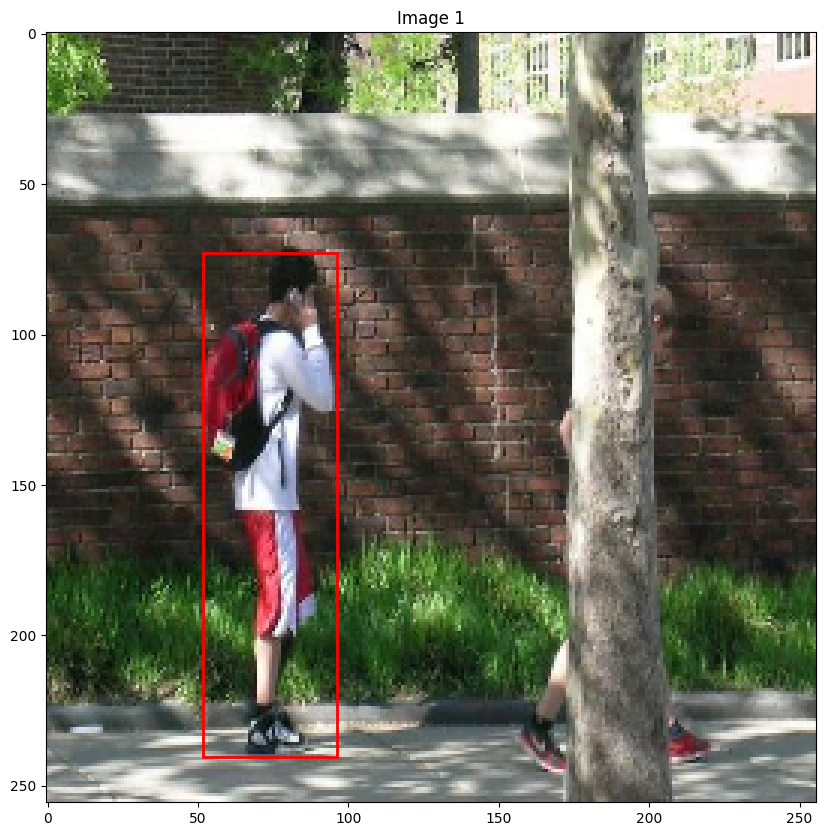

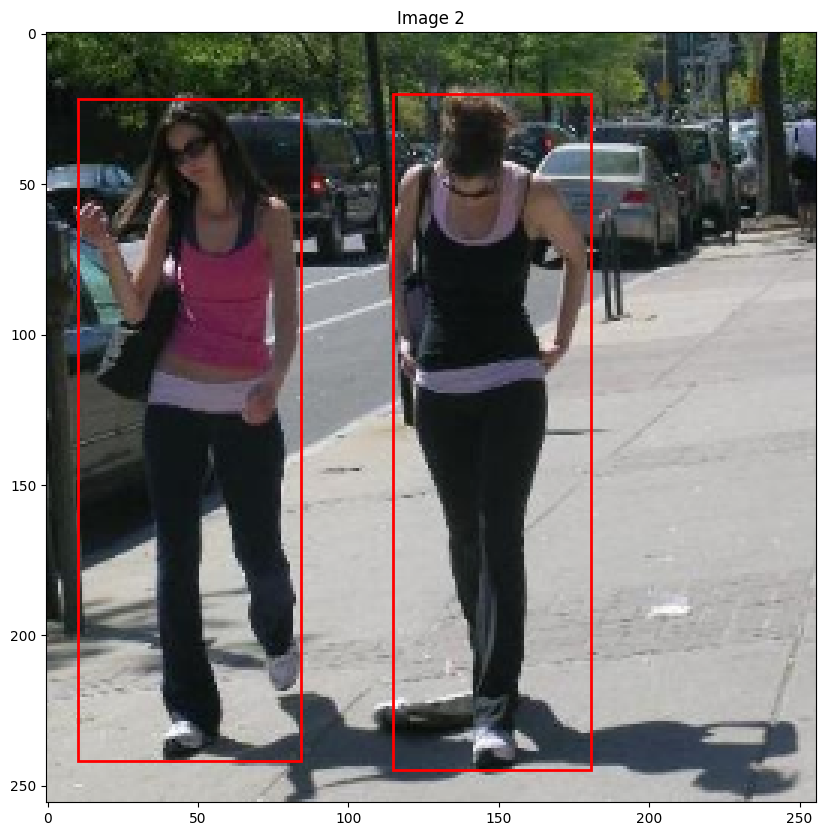

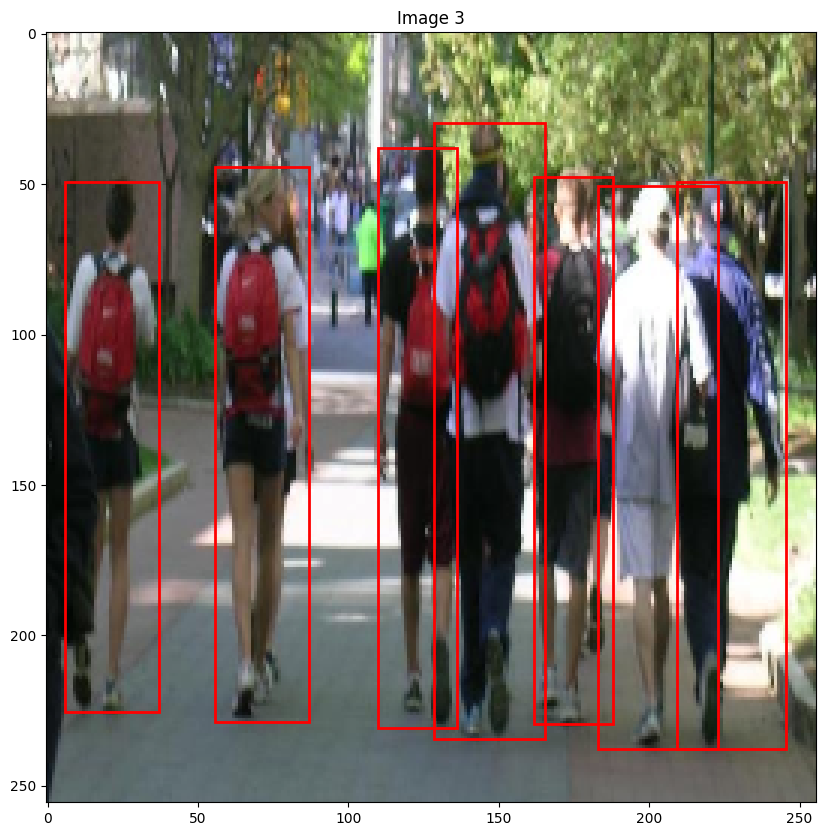

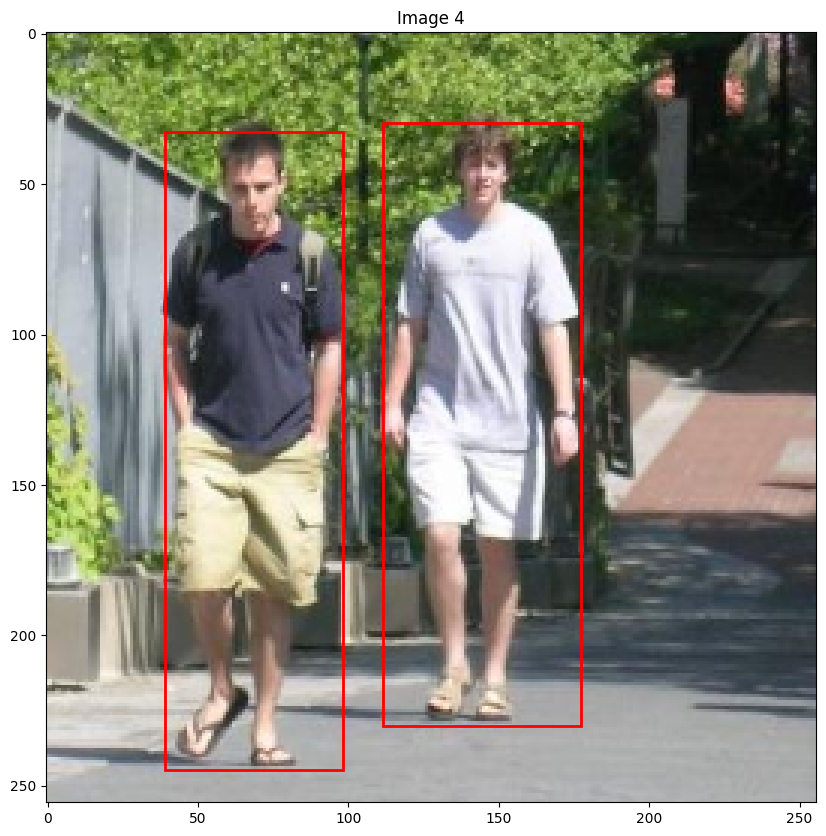

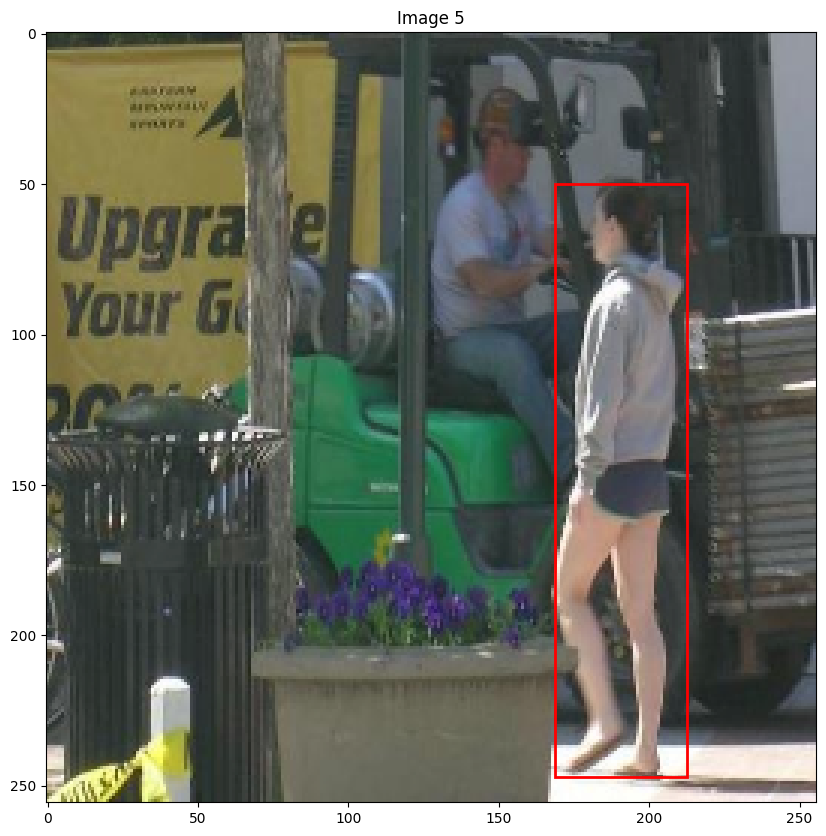

...

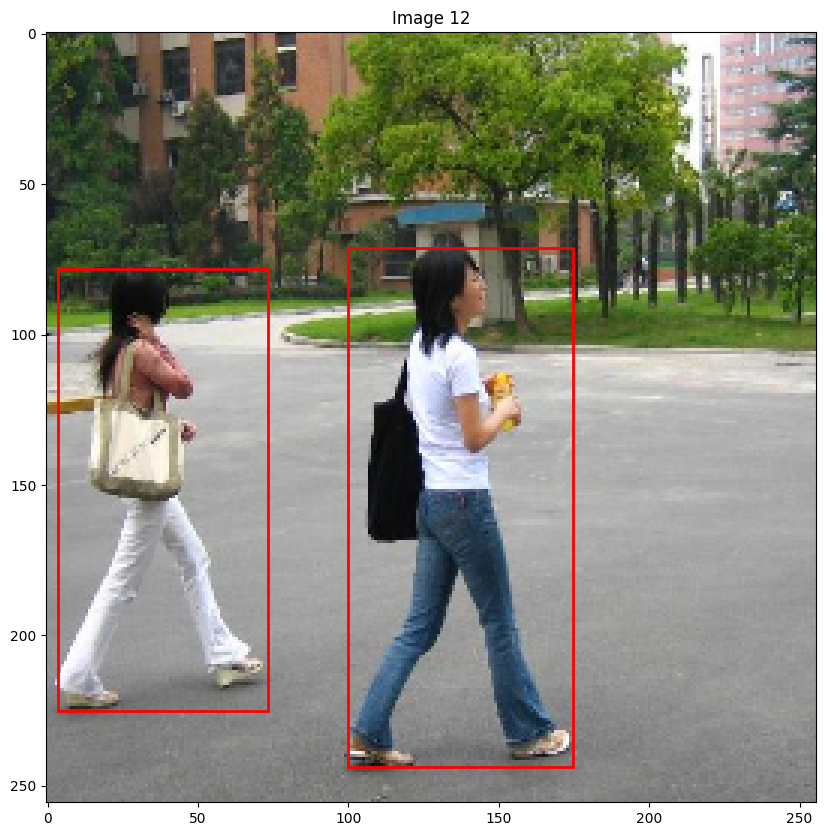

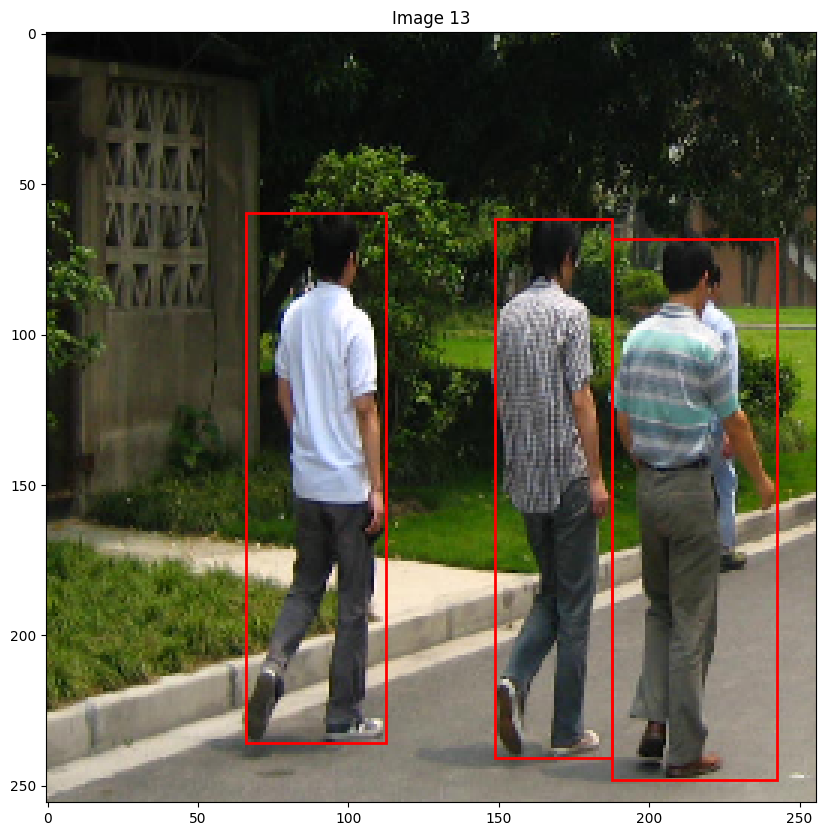

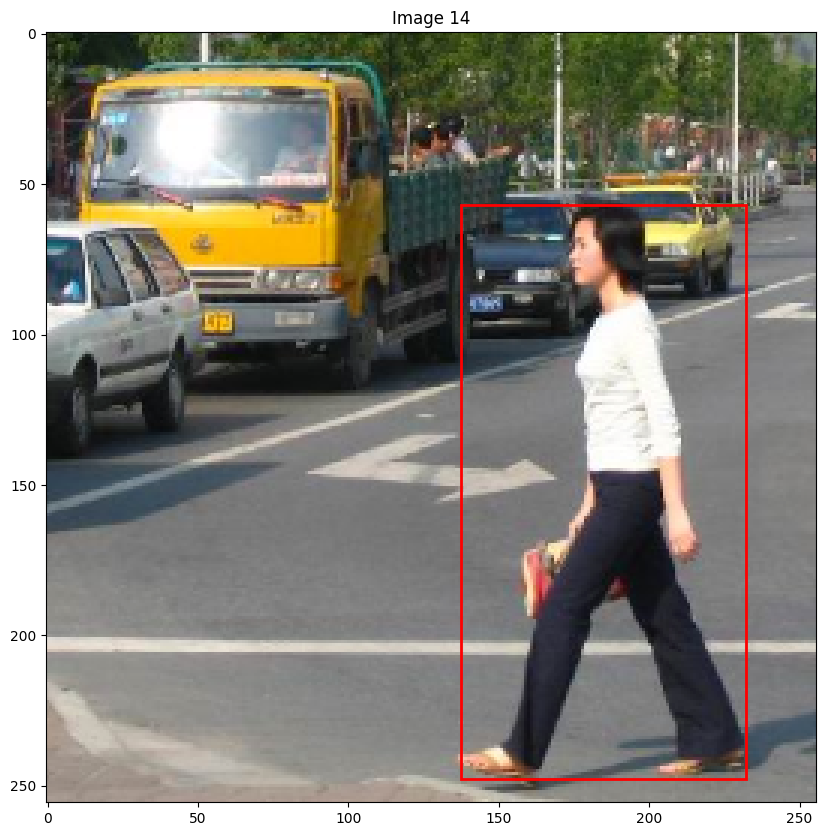

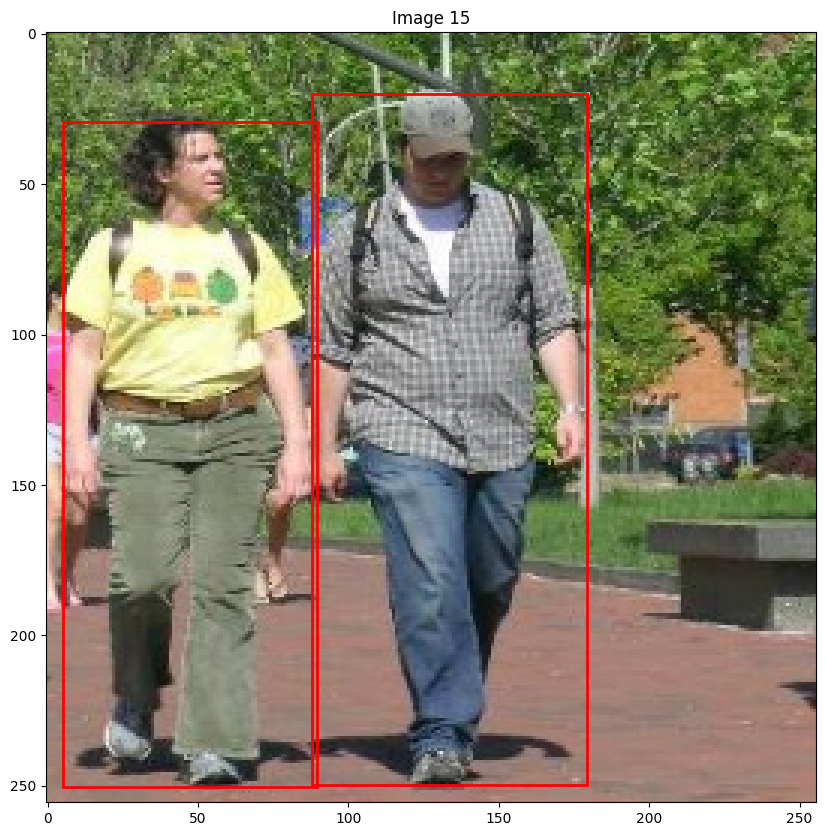

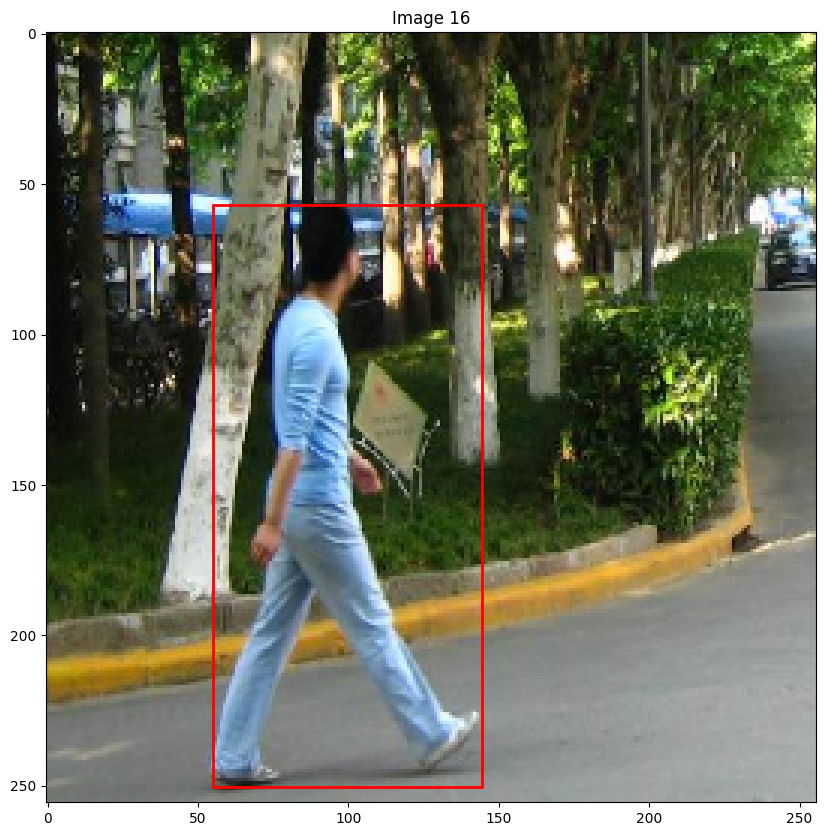

In [ ]:
# Your work here
import numpy
import matplotlib.pyplot as plt
import matplotlib.patches as patches

def denormalize(img): # helper func to denormalise the image
    mean = torch.tensor([0.485, 0.456, 0.406], device=img.device).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225], device=img.device).view(3, 1, 1)
    return img * std + mean

def offsets_to_image_boxes(tensor, image_size, grid_size=(8, 8), objectness_threshold=0.5): # helper func to convert to min and max coords
    img_h, img_w = image_size
    gridy, gridx = grid_size
    cell_h = img_h / gridy
    cell_w = img_w / gridx
    boxes = []
    for gy in range(gridy):
        for gx in range(gridx):
            if tensor[4, gy, gx] > objectness_threshold:
                x_offset = tensor[0, gy, gx]
                y_offset = tensor[1, gy, gx]
                width = tensor[2, gy, gx]
                height = tensor[3, gy, gx]

                x_center = (gx + x_offset) * cell_w
                y_center = (gy + y_offset) * cell_h
                width_px = width * cell_w
                height_px = height * cell_h

                x_min = x_center - (width_px / 2)
                y_min = y_center - (height_px / 2)
                x_max = x_center + (width_px / 2)
                y_max = y_center + (height_px / 2)

                boxes.append([x_min, y_min, x_max, y_max])
    return boxes

# func to plot the predictions for a batch
def plot_batch_predictions(imgs, outputs, batch_size):
  for i in range(batch_size):
    image = imgs[i]
    target = outputs[i]

    image = image.permute(1, 2, 0).cpu().numpy()
    target = target.cpu()
    if image.max() <= 1.0:
      image = (image * 255).astype(np.uint8)
    fig, ax = plt.subplots(1, figsize=(10, 10))
    ax.imshow(image)
    plt.title(f"Image {i + 1}")

    img_h, img_w = image.shape[:2]
    boxes = offsets_to_image_boxes(target, (img_h, img_w), grid_size=(8, 8))

    for box in boxes:
      x_min, y_min, x_max, y_max = box
      width = x_max - x_min
      height = y_max - y_min
      rect = patches.Rectangle(
            (x_min, y_min), width, height,
            linewidth=2, edgecolor='red', facecolor='none'
        )
      ax.add_patch(rect)

    plt.show()


plot_batch_predictions(denormalize(batch_X), batch_y, 16)



## Setting up loss calculations

Objectness is essentially a binary classification task, while predicting the correct bounding box is a regression task.

Set up loss function calculations for objectness using binary cross entropy, and for bounding box localization using MSE. Create both losses in the same function for convenience, but return them separately instead of as a sum so they are easy to log later on.

Concept-wise this is pretty straightforward. However, implementation-wise, you will need to place your tensors with great care. I'll help you a bit by providing you with this template below.

```python
def custom_loss(preds, targets):
    # both preds and targets should have shape (B, 5, gy, gx)
    # where B is batch size, gy and gx are spatial feature map h and w
    ...
    return objectness_loss, localization_loss
```

_1 pt granted upon completion of loss function calculation_

In [ ]:
import torch.nn.functional as F

def custom_loss(preds, targets):
  pred_obj = preds[:, 4]
  target_obj = targets[:, 4]
  objectness_loss = F.binary_cross_entropy_with_logits(pred_obj, target_obj)

  pred_bbox = preds[:, :4]
  target_bbox = targets[:, :4]
  localization_loss = F.mse_loss(pred_bbox, target_bbox)

  return objectness_loss, localization_loss


## Model evalution and baseline score

Create a `test_one_epoch` function that takes the model and the test dataloader as arguments. Calculate and return box IOU score (`torchvision.ops.box_iou`) in a dictionary like so:

```python
>>> metrics = test_one_epoch(model, test_dataloader)
>>> print(metrics)
{"miou": 0.005}
```

_1 pt granted upon implementing `test_one_epoch` and seeing the mean IOU score of the untrained model_

In [ ]:
from torchvision.ops import box_iou

def offset_to_corners(bboxes, grid_size=(8, 8)):
    B, _, H, W = bboxes.shape
    device = bboxes.device
    gy, gx = grid_size

    grid_y, grid_x = torch.meshgrid(
        torch.arange(H, device=device),
        torch.arange(W, device=device),
        indexing='ij'
    )

    grid_x = (grid_x + 0.5) / gx
    grid_y = (grid_y + 0.5) / gy

    x_offset = bboxes[:, 0]
    y_offset = bboxes[:, 1]
    width = bboxes[:, 2]
    height = bboxes[:, 3]

    x_center = grid_x + x_offset / gx
    y_center = grid_y + y_offset / gy

    x_min = x_center - width / 2
    y_min = y_center - height / 2
    x_max = x_center + width / 2
    y_max = y_center + height / 2

    return torch.stack([x_min, y_min, x_max, y_max], dim=1)  # (B, 4, H, W)

def test_one_epoch(model, dataloader):
    total_iou = 0.0
    count = 0
    model.eval()

    with torch.no_grad():
        for images, targets in dataloader:
            images = images.to(device)
            targets = targets.to(device)

            preds = model(images)  # (B, 5, H, W)
            pred_boxes = offset_to_corners(preds[:, :4])  # (B, 4, H, W)
            true_boxes = offset_to_corners(targets[:, :4])  # (B, 4, H, W)

            object_mask = targets[:, 4] > 0.5  # (B, H, W)

            for b in range(images.size(0)):
                mask = object_mask[b]
                if mask.sum() == 0:
                    continue  # Skip images with no objects

                pred_boxes_flat = pred_boxes[b, :, mask].T  # (N, 4)
                true_boxes_flat = true_boxes[b, :, mask].T  # (N, 4)

                ious = box_iou(pred_boxes_flat, true_boxes_flat).diag()  # Pairwise IoU
                total_iou += ious.sum().item()
                count += ious.numel()

    metrics = {"miou": total_iou / count if count > 0 else 0.0}
    return metrics


In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model.to(device)
metrics = test_one_epoch(model, test_dataloader)
print(metrics)

{'miou': 0.0019206592272737143}


## Model training

Train your model on the training set. Track objectness loss and localization loss during training for every 10 minibatches (a). I will leave it up to choose how to combine your losses.

At the end of every epoch, show  on both train (b) and test data (c), and plot prediction outputs of the first batch of the test dataset (d). Save the best performing model with the highest mean IOU score on test (e).

You don't need to run training for too long. I suspect <50 epochs will be sufficient.

_1 pt granted upon completion of (a) to (e)._

_Another 1 pt granted for exceeding 0.4 mean IOU on the test dataset._

In [ ]:
# Your work here
device = 'cuda' if torch.cuda.is_available() else 'cpu'
epochs = 50
optimizer = torch.optim.Adam(model.parameters(), lr=0.001, weight_decay=5e-4)
model.to(device)
batch_number = 0
best_test_iou = float(0)
for epoch in range(epochs):
  epoch_loss = 0.0
  for images, targets in train_dataloader:
    model.train()
    images = images.to(device)
    targets = targets.to(device)
    preds = model(images)
    objectness_loss, localization_loss = custom_loss(preds, targets)
    loss = objectness_loss + 2.0 * localization_loss
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    batch_number += 1
    if (batch_number) % 10 == 0:
      print(f"Batch {batch_number}, Objectness Loss: {objectness_loss.item()}, Localization Loss: {localization_loss.item()}")
  # val phase
  model.eval()
  train_iou = test_one_epoch(model, train_dataloader)
  test_iou = test_one_epoch(model, test_dataloader)
  if test_iou['miou'] > best_test_iou:
    best_test_iou = test_iou['miou']
    torch.save(model.state_dict(), 'bestmodel.pth')
  print(f"Epoch {epoch + 1}, Train IOU: {train_iou['miou']}, Test IOU: {test_iou['miou']}")


Epoch 1, Train IOU: 0.12893654917048322, Test IOU: 0.1145615633059707
Batch 10, Objectness Loss: 0.13456904888153076, Localization Loss: 0.35222047567367554
Epoch 2, Train IOU: 0.11824596118529442, Test IOU: 0.119265381258303
Batch 20, Objectness Loss: 0.12425766885280609, Localization Loss: 0.2654479146003723
Epoch 3, Train IOU: 0.059021398420557494, Test IOU: 0.07846093534227506
Batch 30, Objectness Loss: 0.10170072317123413, Localization Loss: 0.23248407244682312
Epoch 4, Train IOU: 0.2271529748482076, Test IOU: 0.1422691302328014
Batch 40, Objectness Loss: 0.10225285589694977, Localization Loss: 0.1935320347547531
Epoch 5, Train IOU: 0.3029072106264912, Test IOU: 0.24642556169886648
Batch 50, Objectness Loss: 0.0905948281288147, Localization Loss: 0.15873666107654572
Epoch 6, Train IOU: 0.37184981064306005, Test IOU: 0.22597524595021465
Batch 60, Objectness Loss: 0.05210447311401367, Localization Loss: 0.10255466401576996
Epoch 7, Train IOU: 0.5130277449214781, Test IOU: 0.28559866

Best test iou is ~0.371 (Epoch 41)

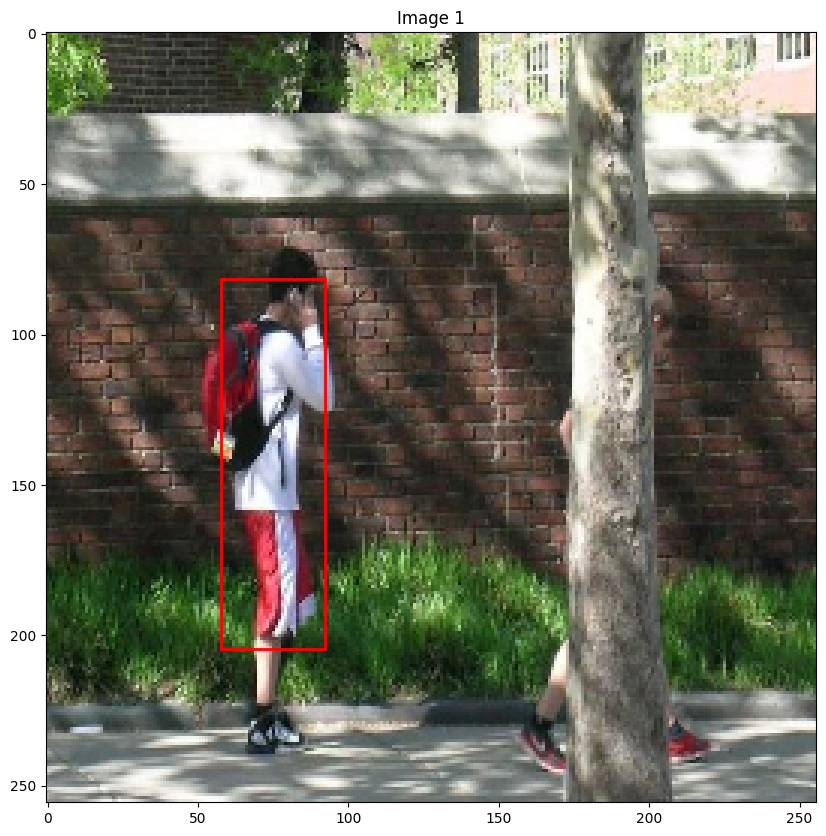

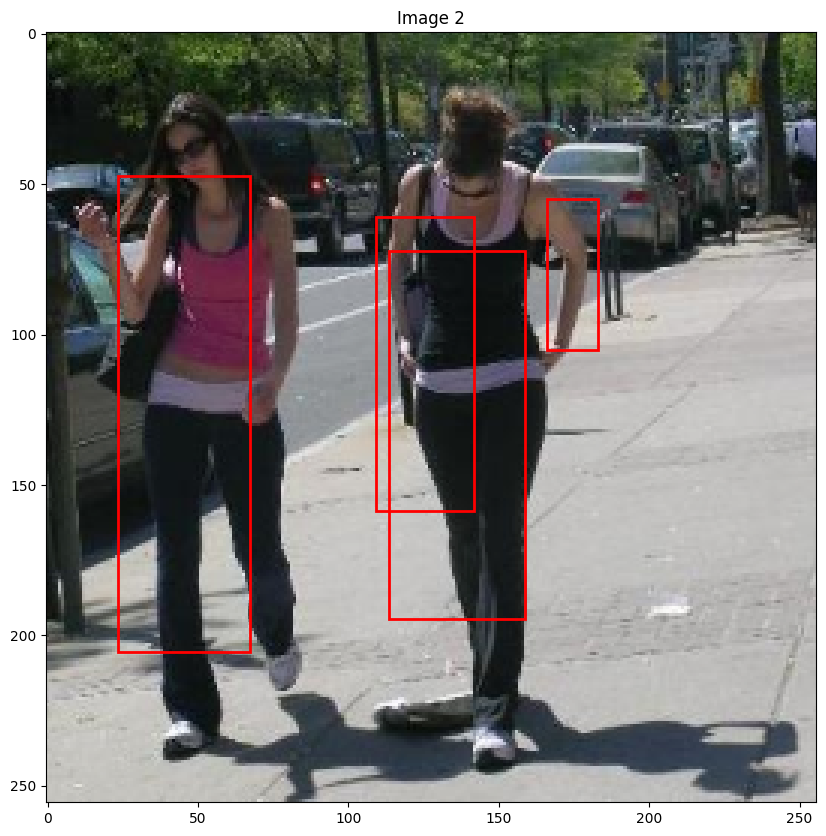

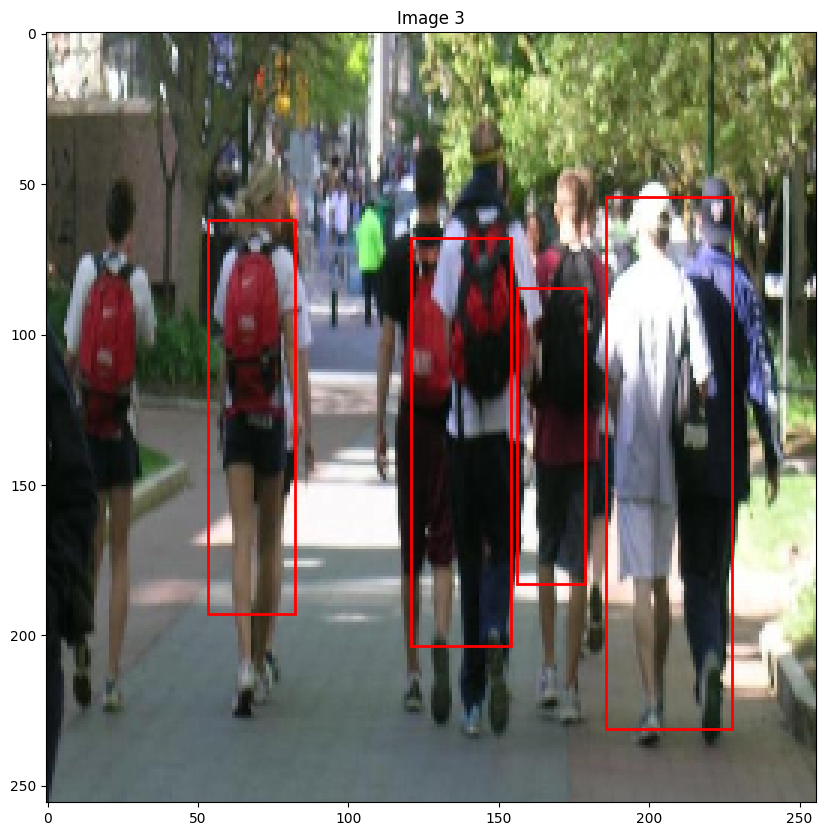

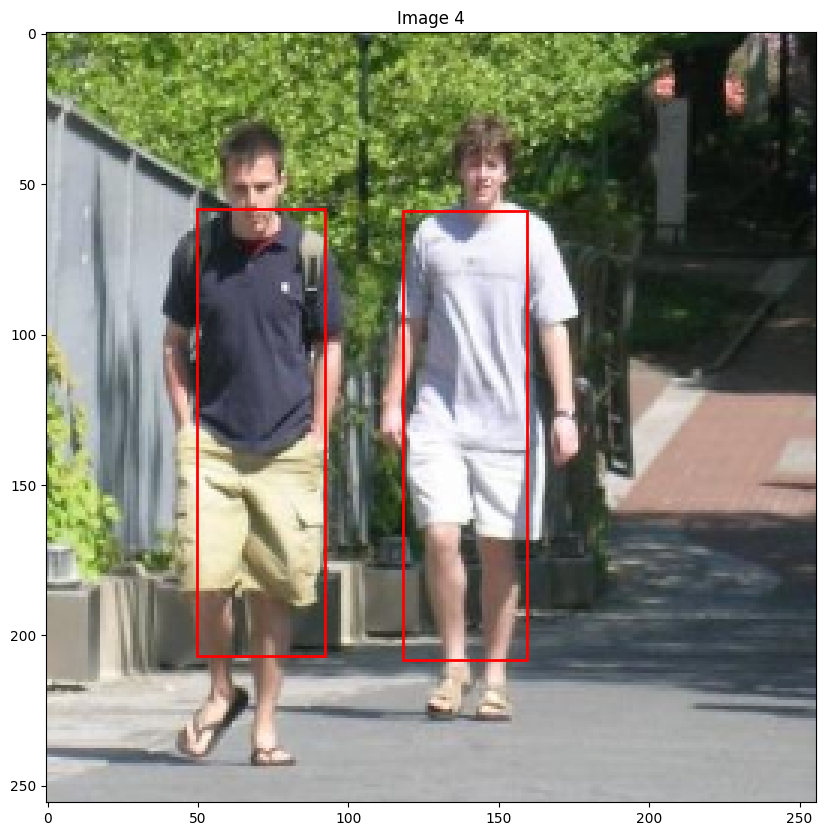

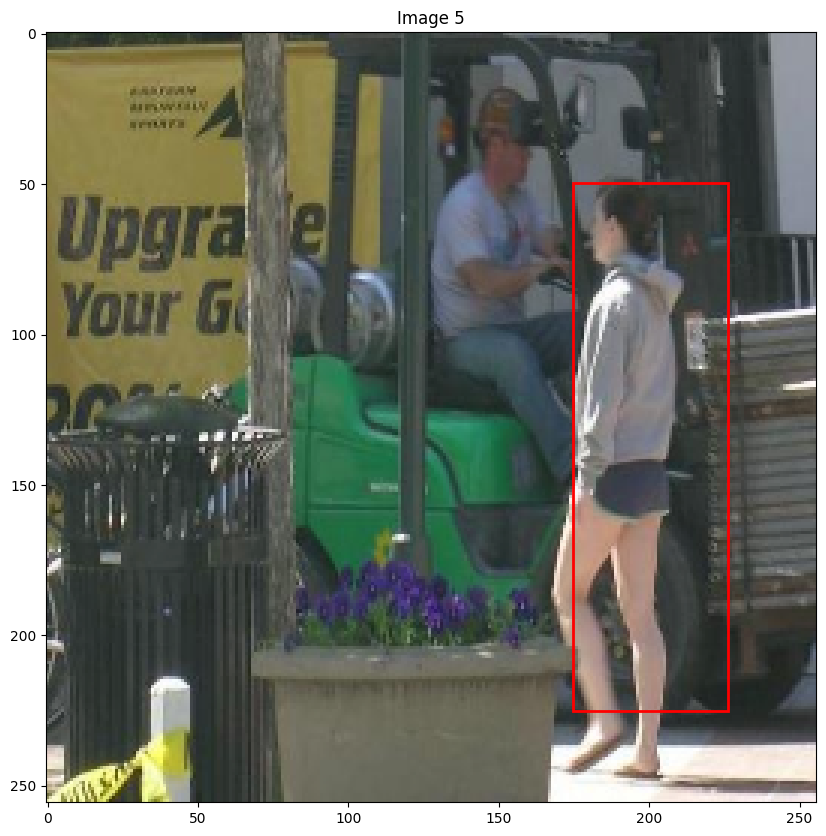

...

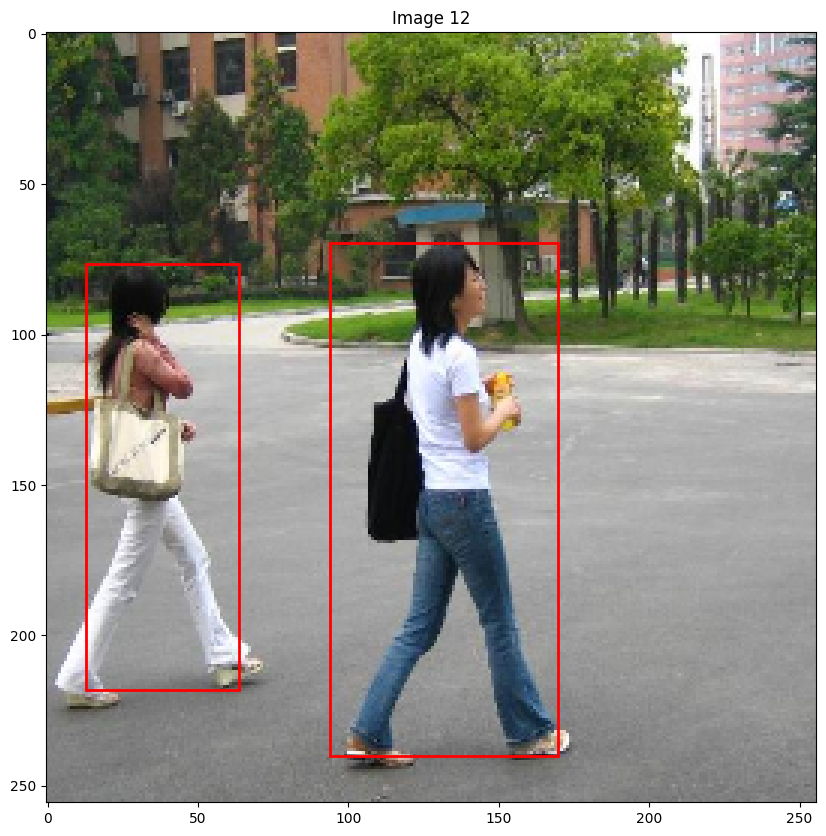

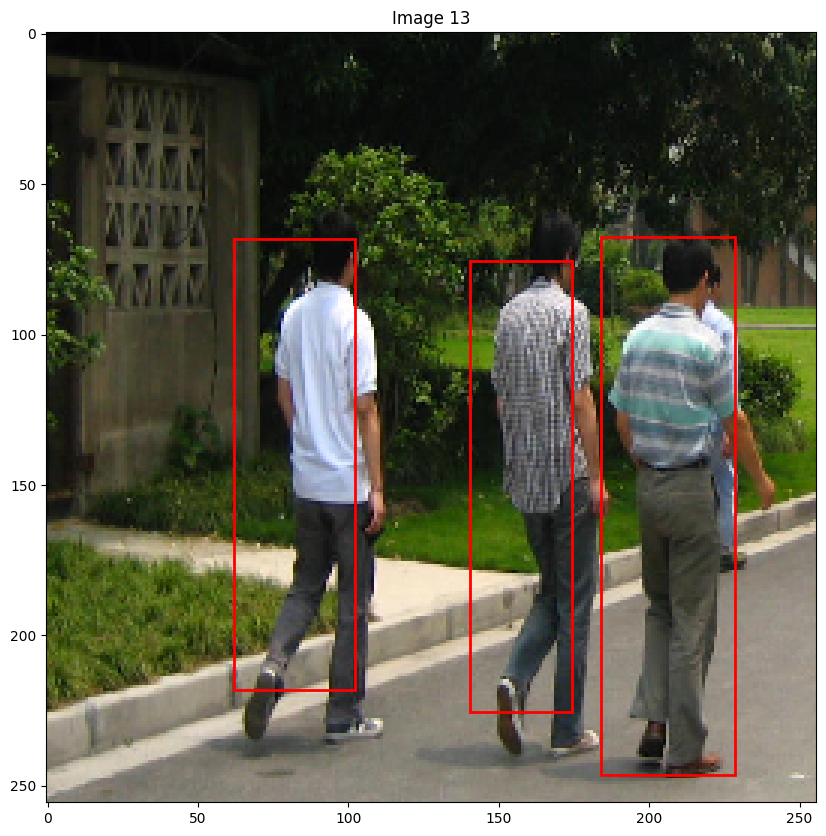

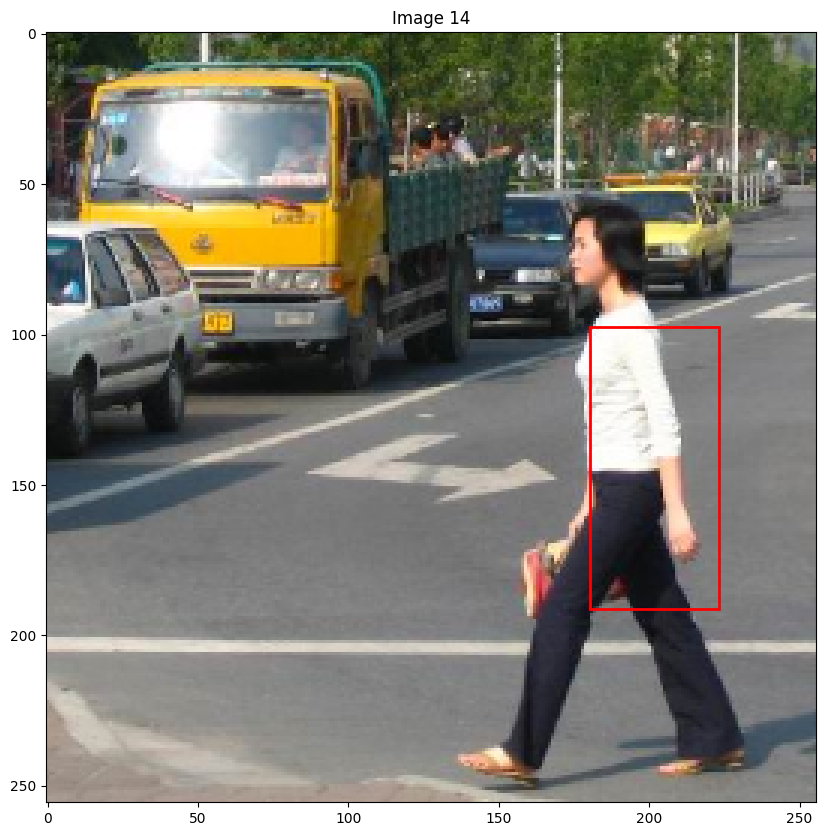

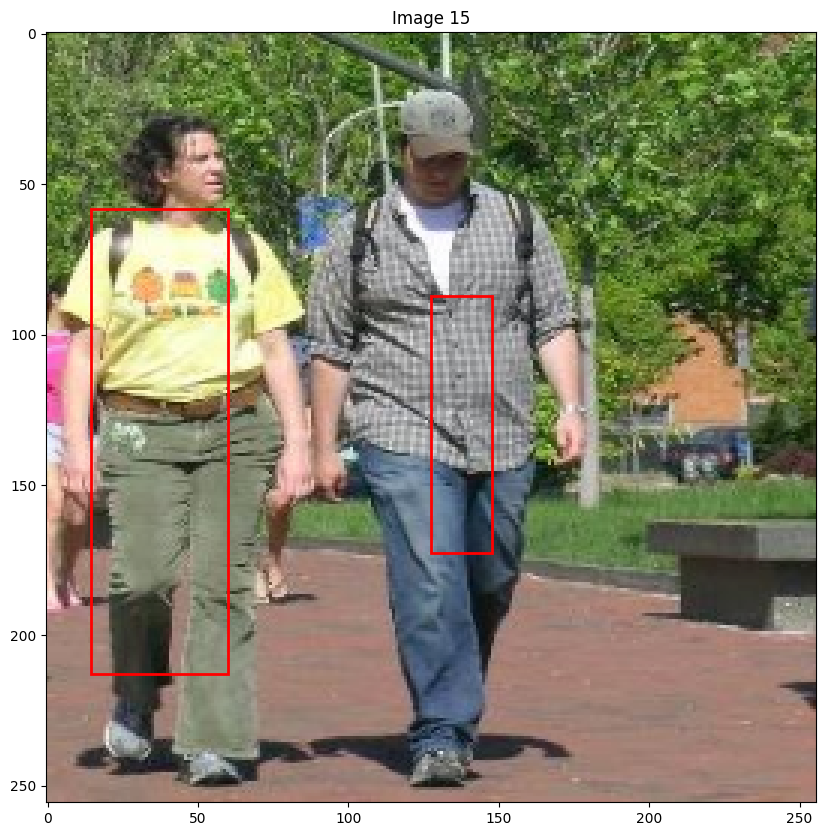

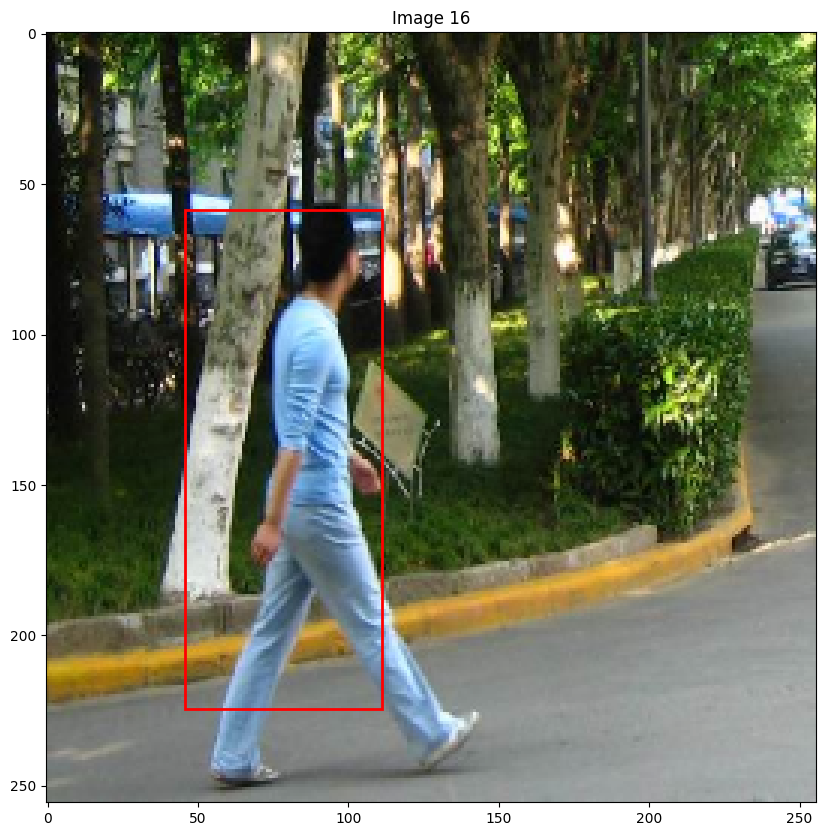

In [ ]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
model.to(device)
model.load_state_dict(torch.load('bestmodel.pth'))
with torch.no_grad():
  model.eval()
  images, targets = next(iter(test_dataloader))
  images = images.to(device)
  targets = targets.to(device)
  preds = model(images)
  plot_batch_predictions(denormalize(images), preds, 16)

## Post training

Create a plot that contains four subplots: image with true bounding boxes, image with predicted bounding boxes, predicted objectness over spatial feature map, true objectness over spatial feature map). Repeat this plot for a few images.

_1 pt granted upon completion of the above_

In [ ]:
def visualize_detections(image, target, prediction, grid_size=(8, 8)):
    import numpy as np
    image=image.to('cpu')
    target=target.to('cpu')
    prediction=prediction.to('cpu')

    image = denormalize(image)  # denormalise image (reusing func above)
    image_np = image.permute(1, 2, 0).numpy()
    image_np = np.clip(image_np, 0, 1)
    img_h, img_w = image_np.shape[:2]

    fig, axs = plt.subplots(2, 2, figsize=(12, 12))
    gridy, gridx = grid_size

    # plotting true bounding boxes
    axs[0,0].imshow(image_np)
    target_boxes = offsets_to_image_boxes(target, (img_h, img_w), grid_size=grid_size)
    for box in target_boxes:
        x_min, y_min, x_max, y_max = box
        width = x_max - x_min
        height = y_max - y_min
        rect = plt.Rectangle((x_min, y_min), width, height,
                              linewidth=2, edgecolor='lime', facecolor='none')
        axs[0,0].add_patch(rect)
    axs[0,0].set_title('Target BBoxes')
    axs[0,0].axis('off')

    # plotting predicted bounding boxes
    axs[0,1].imshow(image_np)
    pred_boxes = offsets_to_image_boxes(prediction, (img_h, img_w), grid_size=grid_size)
    for box in pred_boxes:
        x_min, y_min, x_max, y_max = box
        width = x_max - x_min
        height = y_max - y_min
        rect = plt.Rectangle((x_min, y_min), width, height,
                              linewidth=2, edgecolor='red', facecolor='none')
        axs[0,1].add_patch(rect)
    axs[0,1].set_title('Predicted BBoxes (conf > 0.5)')
    axs[0,1].axis('off')

    # true objectness over spatial feature map
    target_obj = target[4].cpu().numpy()
    im = axs[1,0].imshow(target_obj, cmap='hot', vmin=0, vmax=1)
    plt.colorbar(im, ax=axs[1,0])
    axs[1,0].set_title('Target Objectness Heatmap')
    axs[1,0].grid(False)

    # predicted objectness over spatial feature map
    pred_obj = torch.sigmoid(prediction[4]).cpu().numpy()
    im = axs[1,1].imshow(pred_obj, cmap='hot', vmin=0, vmax=1)
    plt.colorbar(im, ax=axs[1,1])
    axs[1,1].set_title('Predicted Objectness Heatmap')
    axs[1,1].grid(False)

    plt.tight_layout()
    plt.show()


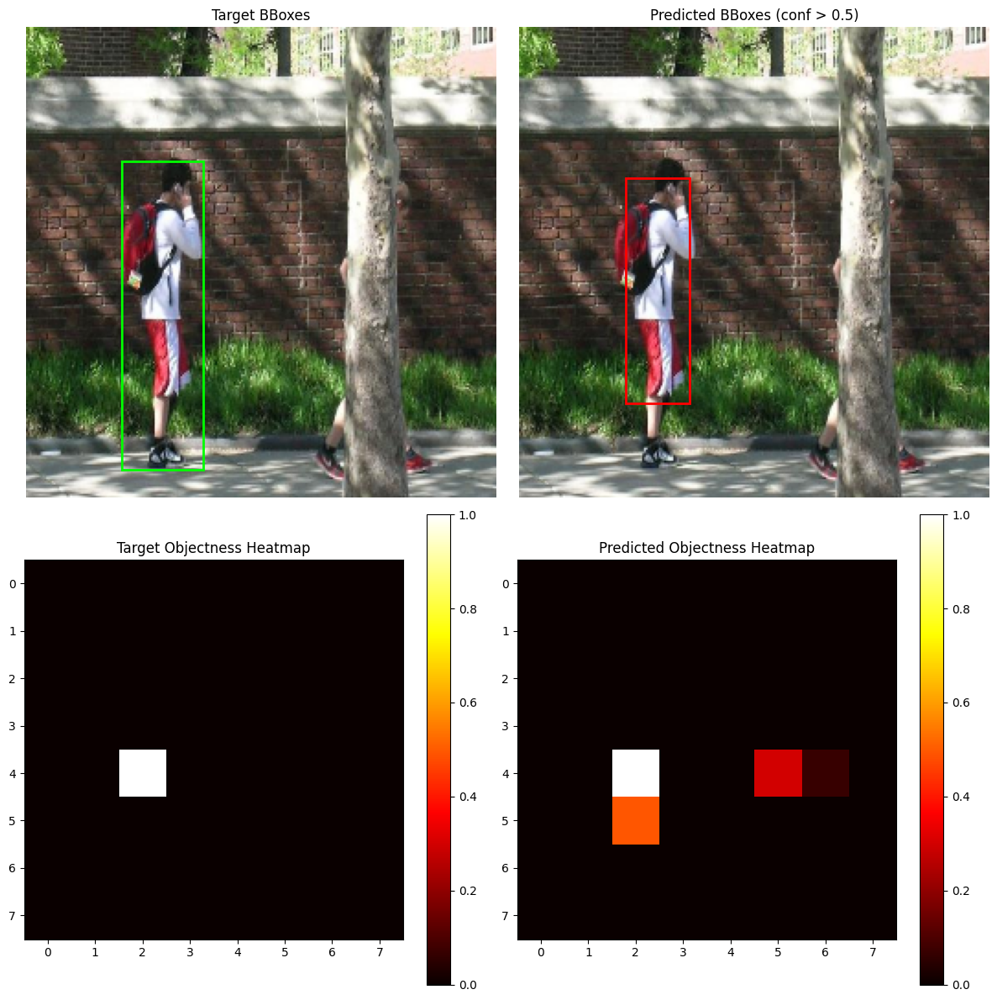

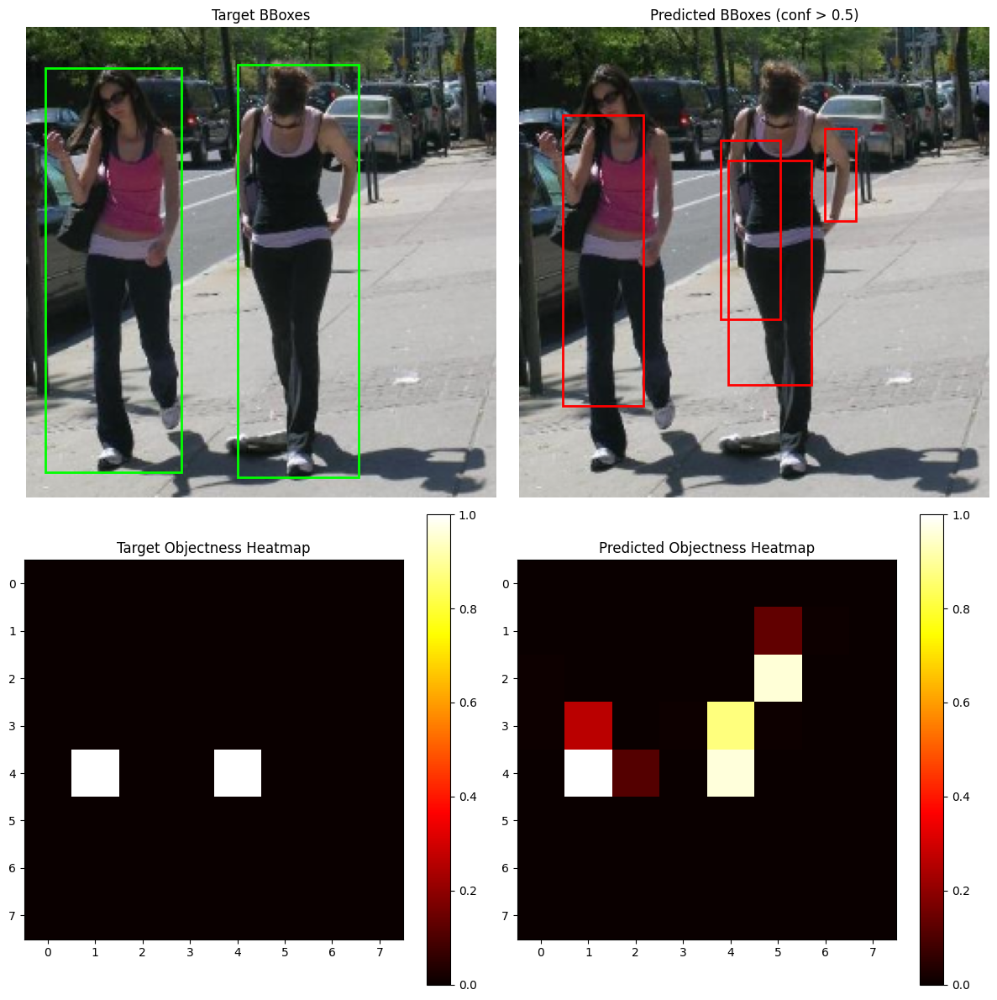

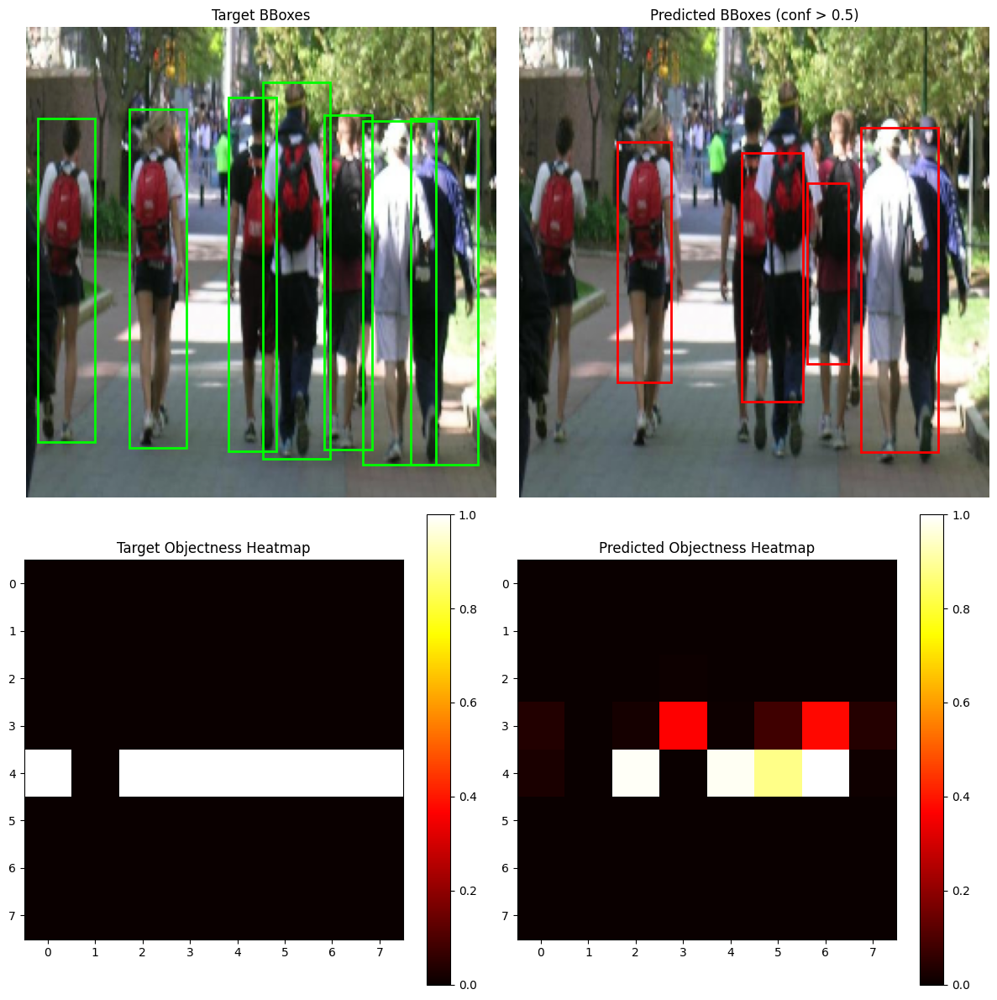

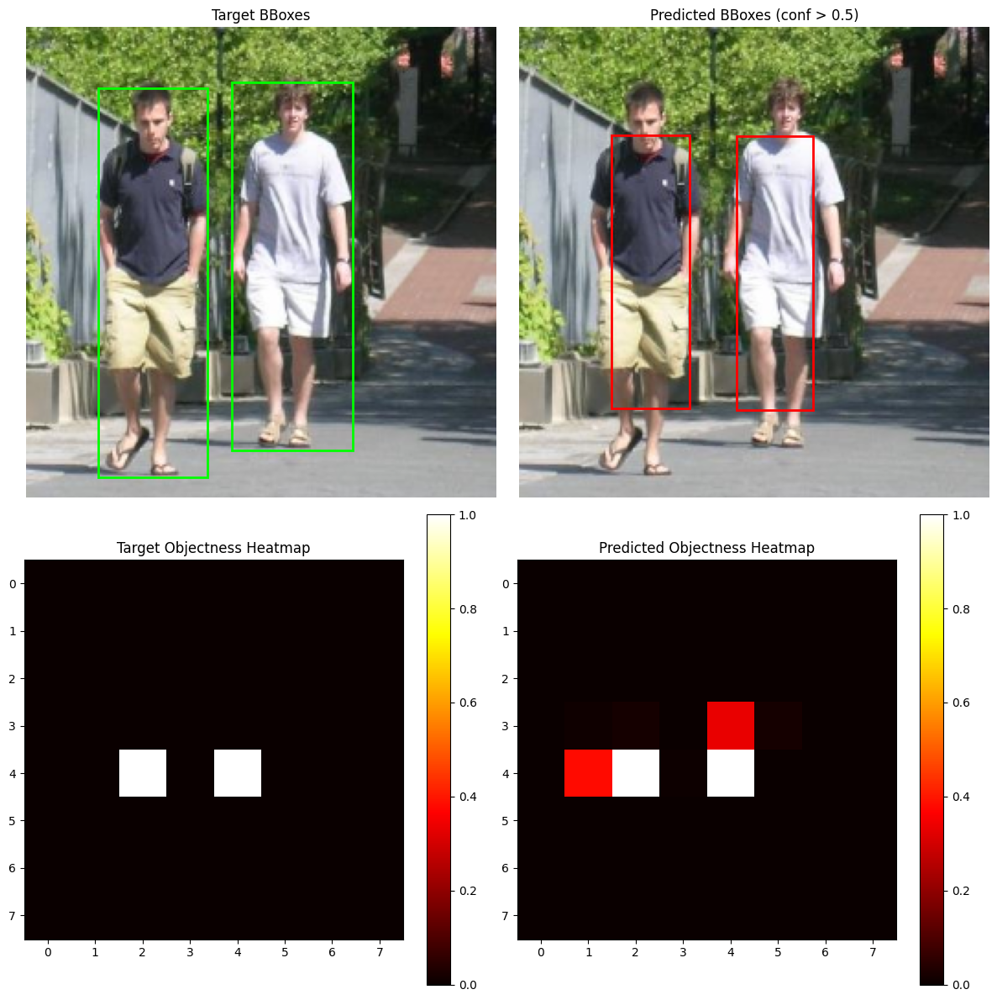

In [ ]:
# plotting predictions and targets for 4 samples
model.load_state_dict(torch.load('bestmodel.pth'))
images, targets = next(iter(test_dataloader))
images = images.to(device)   # (B, 3, H, W)
targets = targets.to(device) # (B, 5, gy, gx)
num_samples = 4

with torch.no_grad():
    preds = model(images)  # (B, 5, gy, gx)

for i in range(num_samples):
    img = images[i]    # (3, H, W)
    tgt = targets[i]   # (5, gy, gx)
    pred = preds[i]    # (5, gy, gx)

    visualize_detections(img, tgt, pred, grid_size=(8, 8))

What learning task did you just perform in this notebook?

_1 pt granted upon finding the right answer_

In [ ]:
# Object Detection

This dataset is 17 years old this year. What is it called?

_1 pt granted upon finding the right answer_

In [ ]:
# Penn-Fudan database

## EX: Going off track

Name a limitation of this training setup and briefly explain your reasoning

_1 pt granted upon a satisfactory answer_

In [ ]:
# Your work here

The loss function used - MSE loss for the bounding box localization is limited. MSE calculates the mean squared error between true and predicted bbox. It only penalises the position errors of the box and don't take into account how much it overlaps with true bbox. There might be similar coordinates but minimal overlap. It may be better to used IoU based loss.

Show me how you can modify this training setup to attain better performance.

_2 pts granted upon successfully scoring at least +0.2 mean IOU higher than the score of the best model above. Partial credit to be granted at discretion. Bonus additional +1 pt to be granted for outstanding improvements_

I am modifying the loss function to use ciou loss for localization

In [ ]:
import torch
import torch.nn.functional as F
from torchvision.ops import complete_box_iou_loss

def modified_loss(preds, targets, grid_size=(8, 8)):
    pred_obj = preds[:, 4]
    target_obj = targets[:, 4]
    objectness_loss = F.binary_cross_entropy_with_logits(pred_obj, target_obj)

    # Convert predictions and targets to corner format
    pred_boxes = offset_to_corners(preds[:, :4], grid_size)  # (B, 4, H, W)
    target_boxes = offset_to_corners(targets[:, :4], grid_size)  # (B, 4, H, W)

    # Reshape for batch processing: (B, 4, H, W) -> (B*H*W, 4)
    B, _, H, W = pred_boxes.shape
    pred_boxes = pred_boxes.permute(0, 2, 3, 1).reshape(-1, 4)  # (B*H*W, 4)
    target_boxes = target_boxes.permute(0, 2, 3, 1).reshape(-1, 4)  # (B*H*W, 4)

    # Calculate CIoU loss only where there are objects (target_obj == 1)
    obj_mask = target_obj.reshape(-1) > 0.5

    # Only compute loss for positive samples
    if obj_mask.any():
        localization_loss = complete_box_iou_loss(
            pred_boxes[obj_mask],
            target_boxes[obj_mask],
            reduction='mean'
        )
    else:
        localization_loss = torch.tensor(0.0, device=preds.device)

    return objectness_loss, localization_loss

In [ ]:
# new training loop

device = 'cuda' if torch.cuda.is_available() else 'cpu'
epochs = 50
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001, weight_decay=5e-4)
model.to(device)
batch_number = 0

for epoch in range(epochs):
  epoch_loss = 0.0
  for images, targets in train_dataloader:
    model.train()
    images = images.to(device)
    targets = targets.to(device)
    preds = model(images)
    objectness_loss, localization_loss = modified_loss(preds, targets)
    loss = objectness_loss + 2.0 * localization_loss
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()
    batch_number += 1
    if (batch_number) % 10 == 0:
      print(f"Batch {batch_number}, Objectness Loss: {objectness_loss.item()}, Localization Loss: {localization_loss}")
  # val phase
  model.eval()
  train_iou = test_one_epoch(model, train_dataloader)
  test_iou = test_one_epoch(model, test_dataloader)

  print(f"Epoch {epoch + 1}, Train IOU: {train_iou['miou']}, Test IOU: {test_iou['miou']}")


Epoch 1, Train IOU: 0.7604890046669198, Test IOU: 0.3228518835119443
Batch 10, Objectness Loss: 0.000662348058540374, Localization Loss: 0.23393528163433075
Epoch 2, Train IOU: 0.7641446768969029, Test IOU: 0.3931853293116423
Batch 20, Objectness Loss: 0.002244788222014904, Localization Loss: 0.22917479276657104
Epoch 3, Train IOU: 0.795229378226283, Test IOU: 0.4059689579571793
Batch 30, Objectness Loss: 0.0010811302345246077, Localization Loss: 0.1818174123764038
Epoch 4, Train IOU: 0.7932655302969901, Test IOU: 0.43373092393862245
Batch 40, Objectness Loss: 0.0017216326668858528, Localization Loss: 0.1669488549232483
Epoch 5, Train IOU: 0.8213190087327013, Test IOU: 0.43663216722600257
Batch 50, Objectness Loss: 0.0008580649155192077, Localization Loss: 0.1320836842060089
Epoch 6, Train IOU: 0.8325202583192705, Test IOU: 0.47573051114141207
Batch 60, Objectness Loss: 0.0017537064850330353, Localization Loss: 0.21849952638149261
Epoch 7, Train IOU: 0.8042329726992427, Test IOU: 0.500

By changing the loss function for localization, test iou improved to 0.6385 from 0.371 previously

In [ ]:
torch.save(model.state_dict(), 'new_bestmodel.pth')

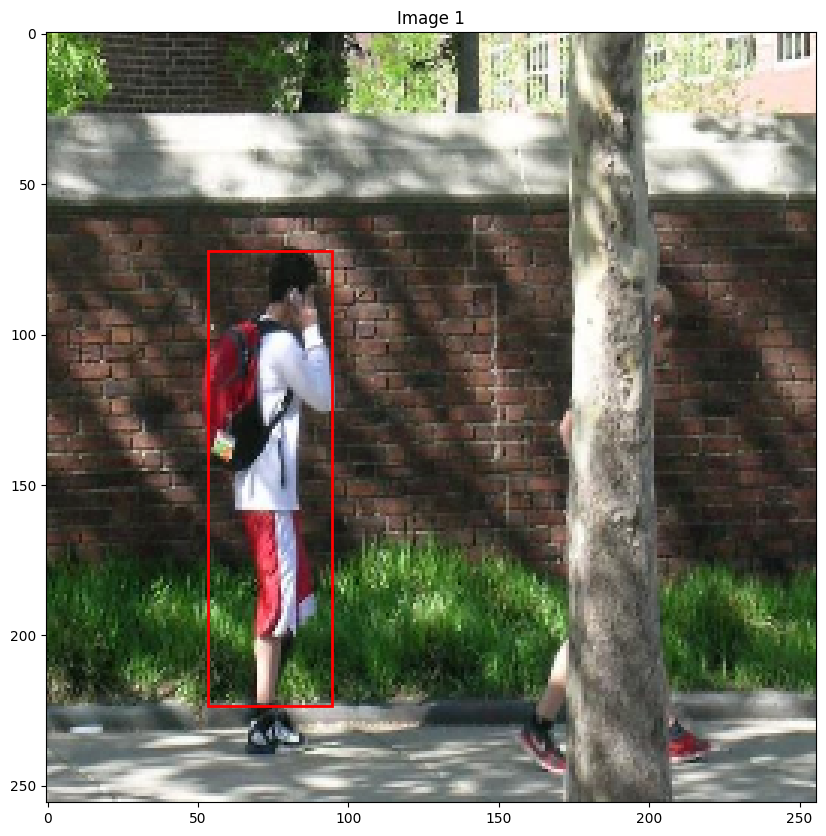

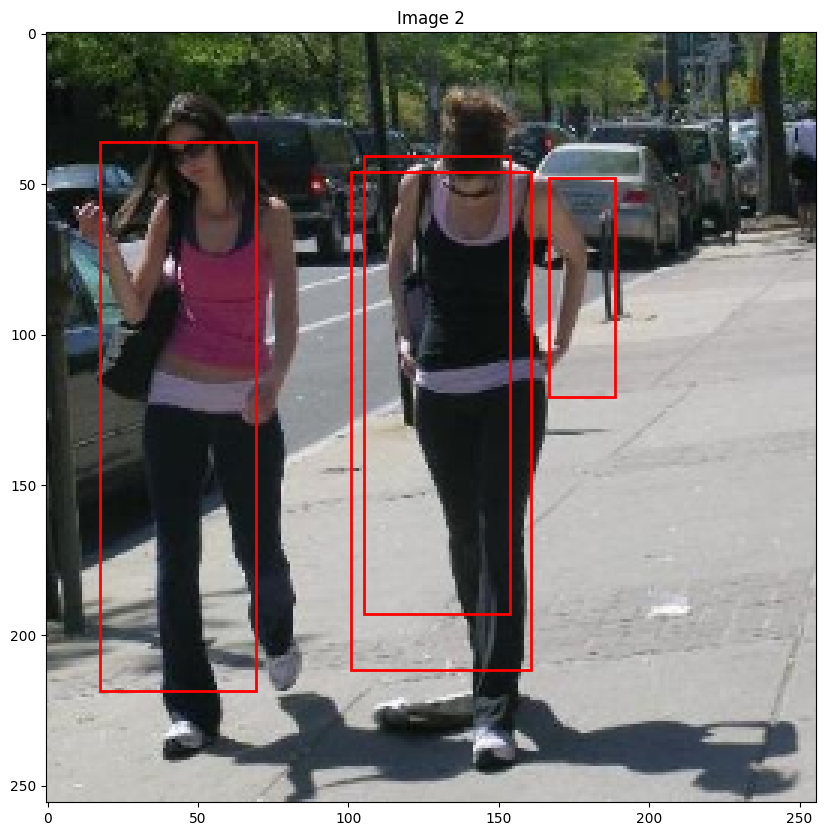

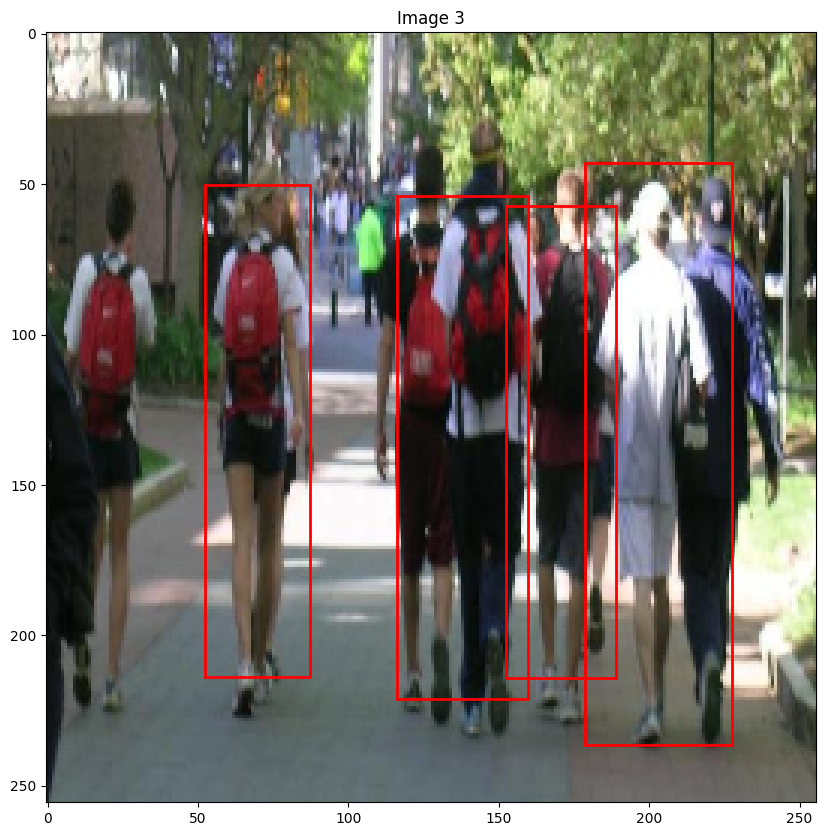

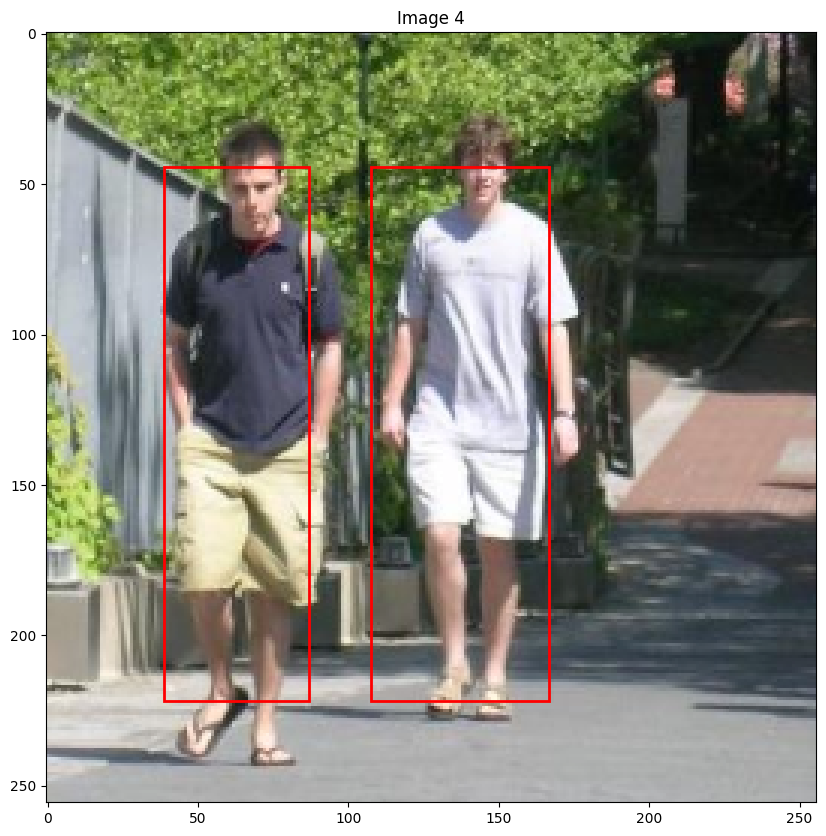

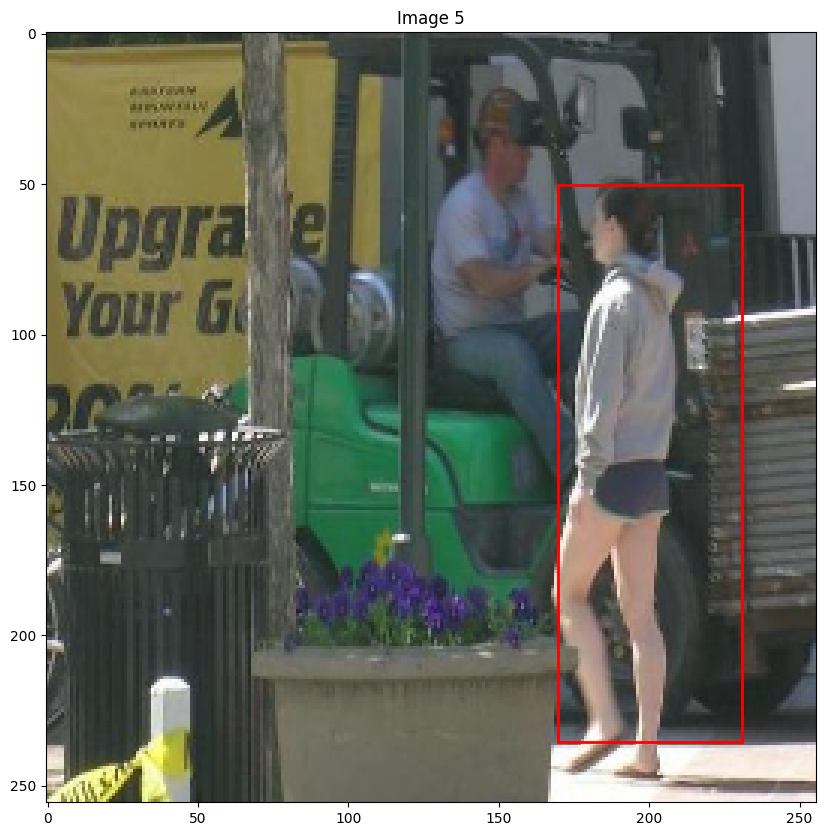

...

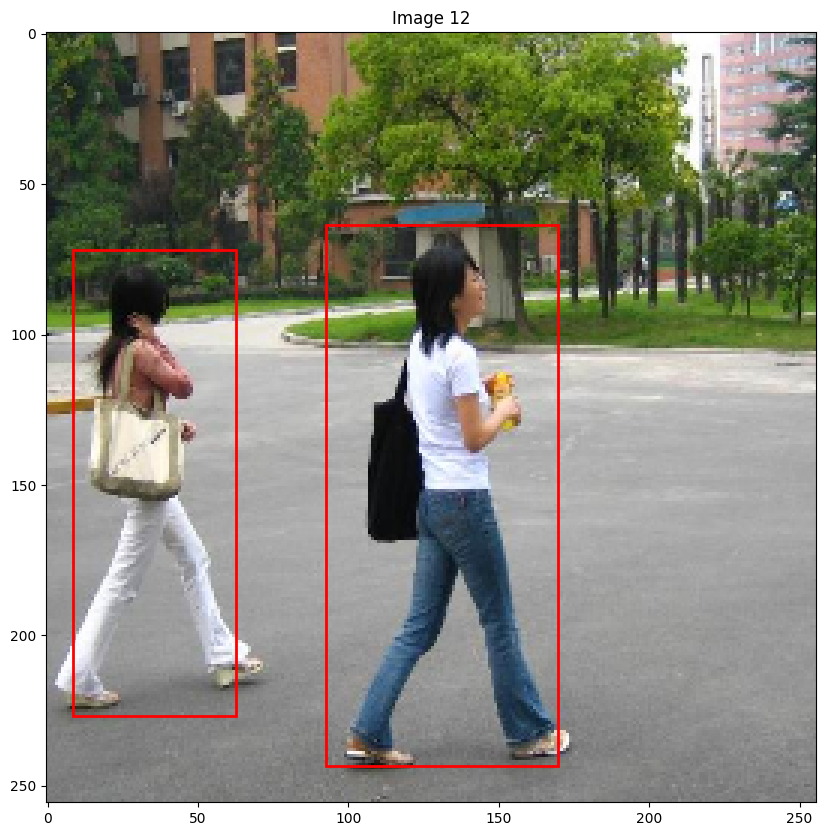

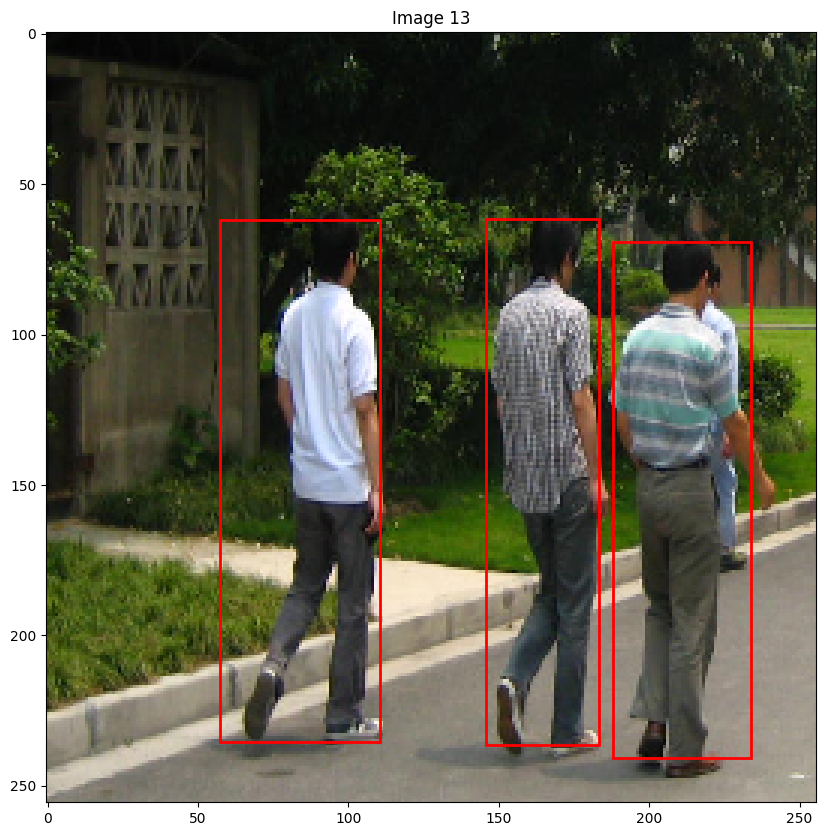

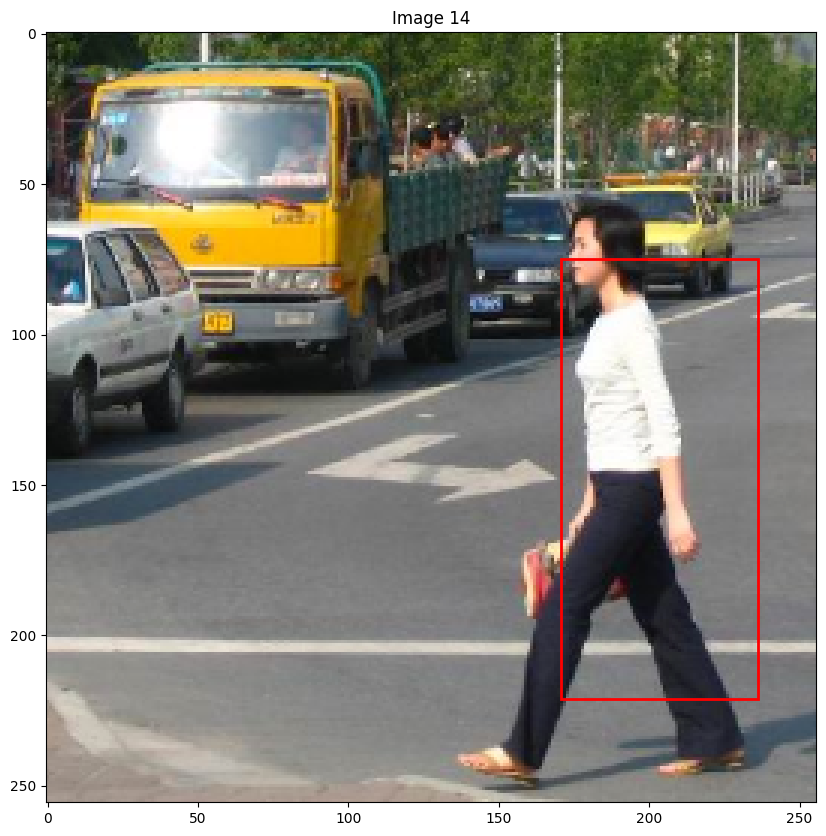

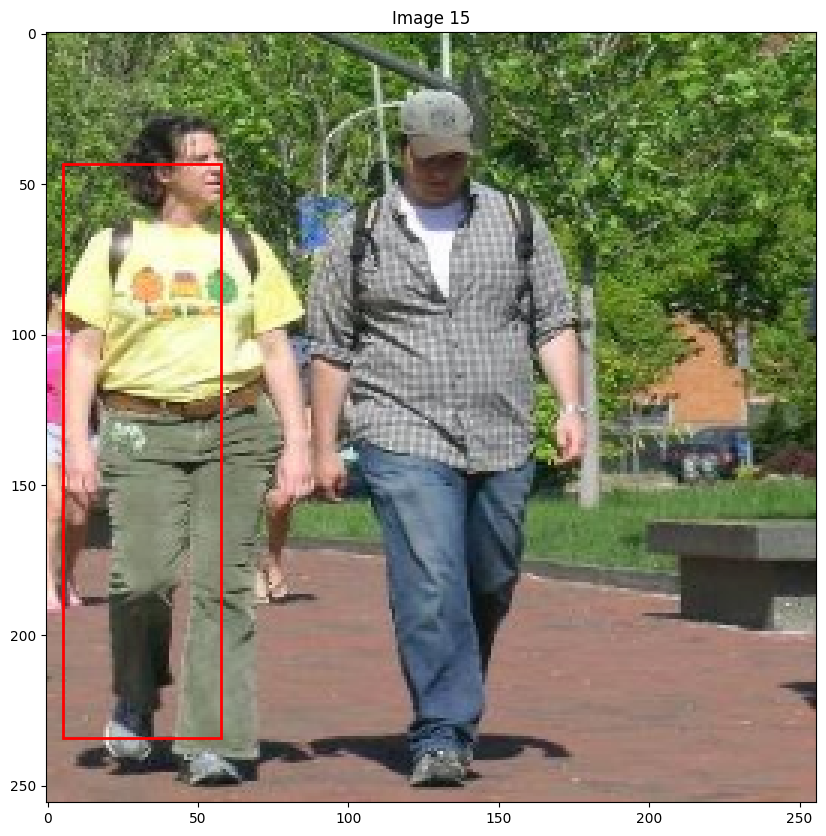

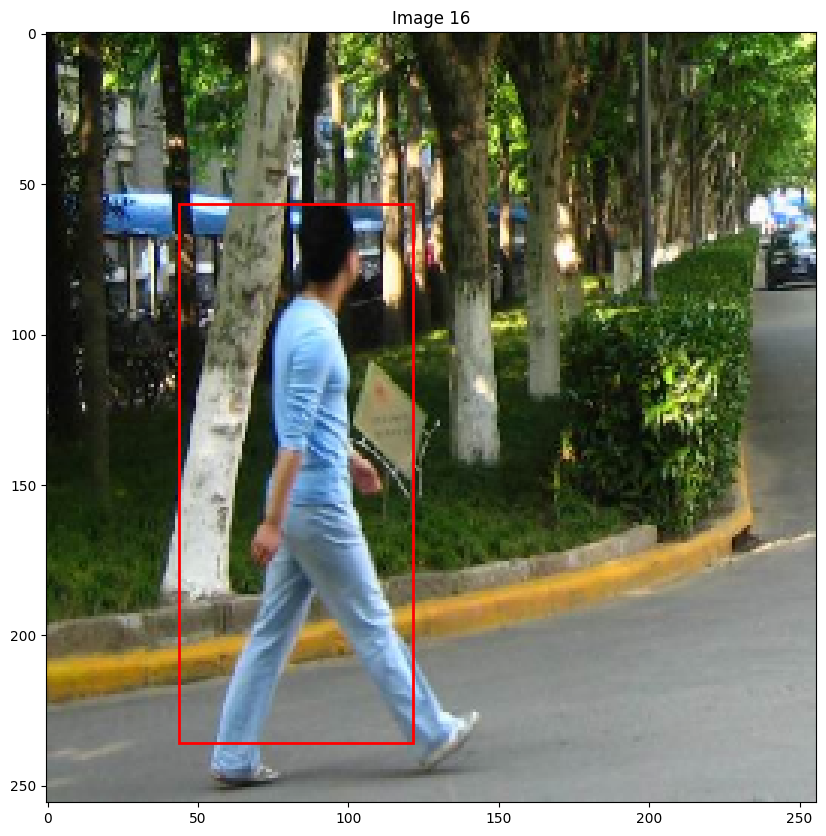

In [ ]:
# testing the new model on a single batch

model.load_state_dict(torch.load('new_bestmodel.pth'))
with torch.no_grad():
  model.eval()
  images, targets = next(iter(test_dataloader))
  images = images.to(device)
  targets = targets.to(device)
  preds = model(images)
  plot_batch_predictions(denormalize(images), preds, 16)

Looking at the new predictions, it is doing better with multiple people in an image and with overlapping bboxes. However, the model still struggles with differentiaing arms and legs from people.